<a href="https://colab.research.google.com/github/Lodia15/Monet_Paintings_Lodia/blob/main/next_Monet_Lodia_exp1_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! pip install kaggle

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os
checkpoint_dir = "/content/drive/MyDrive/Monet"
os.makedirs(checkpoint_dir, exist_ok=True)
print("Checkpoint directory:", checkpoint_dir)


Checkpoint directory: /content/drive/MyDrive/Monet


In [4]:
!mkdir -p ~/.kaggle

In [5]:
!cp /content/drive/MyDrive/ColabNotebooks/kaggle_API_credentials/kaggle.json ~/.kaggle/kaggle.json

In [6]:
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
!kaggle datasets list


ref                                                           title                                                size  lastUpdated                 downloadCount  voteCount  usabilityRating  
------------------------------------------------------------  ---------------------------------------------  ----------  --------------------------  -------------  ---------  ---------------  
wardabilal/spotify-global-music-dataset-20092025              Spotify Global Music Dataset (2009–2025)          1289021  2025-11-11 09:43:05.933000          16387        384  1.0              
neurocipher/heartdisease                                      Heart Disease                                        3491  2025-12-11 15:29:14.327000           2114         55  1.0              
kundanbedmutha/exam-score-prediction-dataset                  Exam Score Prediction Dataset                      325454  2025-11-28 07:29:01.047000           5863        120  1.0              
prince7489/laptop-battery-health-an

In [8]:
! kaggle competitions download -c gan-getting-started

 83% 306M/367M [00:00<00:00, 832MB/s] 
100% 367M/367M [00:00<00:00, 686MB/s]


In [9]:
! unzip gan-getting-started

Streaming output truncated to the last 5000 lines.
  inflating: photo_jpg/46e84039a1.jpg  
  inflating: photo_jpg/46f391abec.jpg  
  inflating: photo_jpg/46f5ef1042.jpg  
  inflating: photo_jpg/4706619607.jpg  
  inflating: photo_jpg/4707b03a08.jpg  
  inflating: photo_jpg/47100a9939.jpg  
  inflating: photo_jpg/471f4755b9.jpg  
  inflating: photo_jpg/472b351bc4.jpg  
  inflating: photo_jpg/472d5ac100.jpg  
  inflating: photo_jpg/4758e5dd4c.jpg  
  inflating: photo_jpg/4762bb79ef.jpg  
  inflating: photo_jpg/4778b13518.jpg  
  inflating: photo_jpg/4787b82d37.jpg  
  inflating: photo_jpg/478e07feaa.jpg  
  inflating: photo_jpg/478eb12a82.jpg  
  inflating: photo_jpg/479698b371.jpg  
  inflating: photo_jpg/4796d67f61.jpg  
  inflating: photo_jpg/47aad493bd.jpg  
  inflating: photo_jpg/47ae0edd23.jpg  
  inflating: photo_jpg/47b94957ff.jpg  
  inflating: photo_jpg/47bb43fe3e.jpg  
  inflating: photo_jpg/47bb59d449.jpg  
  inflating: photo_jpg/47d391d94b.jpg  
  inflating: photo_jpg/47df26

In [7]:
! pip install wandb weave

In [8]:
! wandb login

wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Find your API key here: https://wandb.ai/authorize?ref=models
wandb: Paste an API key from your profile and hit enter: 
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: llodi22 (llodi22-free-university-of-tbilisi-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


In [9]:
!unzip -qq gan-getting-started.zip -d gan_data

In [23]:
import os
from glob import glob

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

from PIL import Image
import matplotlib.pyplot as plt
import wandb


# ============================================================
# 1. W&B INIT
# ============================================================
wandb.init(
    project="Monet_Paintings_Lodia",
    config={
        "image_size": 256,
        "batch_size": 1,         # CycleGAN paper also uses batch size = 1
        "lr": 0.0002,
        "beta1": 0.5,
        "beta2": 0.999,
        "lambda_cyc": 10.0,      # weight for cycle-consistency loss
        "lambda_idt": 5.0,       # weight for identity loss (= 0.5 * lambda_cyc)
        "epochs": 25,
        "model": "CycleGAN_LSGAN_ResNet"
    }
)
config = wandb.config

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on:", device)

D_M,█▃▂▃▁▃▃▂▂▂▂▁▂▂▂▃▂▂▂▂▃▂▁▂▃▁▂▂▂▂▁▂▂▃▁▃▁▁▁▂
D_P,█▃▂▂▂▂▂▂▁▁▁▂▂▂▁▂▂▂▁▁▂▃▁▂▁▂▂▁▁▁▃▂▁▁▂▁▁▂▁▂
G_M2P_adv,▄▃▃▃▅▃▂▄█▄▅▂▃▃▅▂▄▂▃▂▂▆▂▅▁▅▁▁▃▄▁▅▂▃▆▃▃▆▃▃
G_P2M_adv,▃▂▄▂▂▄▃▄▂▄▃▂▃▃▃▇▂▄▄▃▅▃▄▃▆▄▃▆▆▅▅▆▄▆▁▄▂█▃▄
G_total,▇▆▇▅▆▄▅▅▃▃▆▃▄▅▇▂▂▃▂▃▄▅▅▃▅█▂▁▄▄▆█▄▃█▃▅▃▄▂
cycle_loss,▆▄▃▂██▃▂▂▅▃▂▅▄▂▃▂▃▂▄▁▂▂▄▁▂▃▂▂▂▂▂▂▃▂▁▃▃▂▁
idt_M,█▂▂▂▃▂▂▃▂▄▅▄▂▃▃▄▂▃▃▃▁▂▅▃▃▃▂▁▄▂▂▂▃▃▁▂▂▄▂▄
idt_P,▄▂▃▄▃▂▂▂▃▄▂▂▂▂▂█▃▄▄▂▃▂▂▃▂▂▄▂▂▂▁▃▆▃▂▃▂▁▄▃
D_M,0.25371
D_P,0.19793
G_M2P_adv,0.25337


Running on: cuda


In [24]:
class MonetPhotoDataset(Dataset):
    """
    Unpaired dataset:
    - domain A: photos (photo_jpg)
    - domain B: Monet paintings (monet_jpg)

    We don't have aligned pairs, so for each index we pick:
    - one photo from A (cyclic over list)
    - one Monet from B (cyclic over list)
    """

    def __init__(self, root_photo, root_monet, transform=None):
        self.photo_files = sorted(glob(os.path.join(root_photo, "*.jpg")))
        self.monet_files = sorted(glob(os.path.join(root_monet, "*.jpg")))
        self.transform = transform

        self.len_A = len(self.photo_files)
        self.len_B = len(self.monet_files)
        self.length = max(self.len_A, self.len_B)

    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        # cycle through if lengths differ
        photo_path = self.photo_files[idx % self.len_A]
        monet_path = self.monet_files[idx % self.len_B]

        photo = Image.open(photo_path).convert("RGB")
        monet = Image.open(monet_path).convert("RGB")

        if self.transform:
            photo = self.transform(photo)
            monet = self.transform(monet)

        # return (A, B) where:
        # A = real photo, B = real Monet
        return photo, monet


# transforms: resize + flip + tensor + normalize to [-1, 1]
transform = transforms.Compose([
    transforms.Resize((config.image_size, config.image_size)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5),
                         (0.5, 0.5, 0.5)),
])

data_root = "/content/gan_data"
dataset = MonetPhotoDataset(
    root_photo=os.path.join(data_root, "photo_jpg"),
    root_monet=os.path.join(data_root, "monet_jpg"),
    transform=transform
)

dataloader = DataLoader(dataset, batch_size=config.batch_size, shuffle=True)
print("Dataset size:", len(dataset))


Dataset size: 7038


In [25]:
class ResNetBlock(nn.Module):
    def __init__(self, dim):
        super(ResNetBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim),
            nn.ReLU(True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(dim, dim, kernel_size=3, padding=0),
            nn.InstanceNorm2d(dim)
        )

    def forward(self, x):
        return x + self.conv_block(x)

In [26]:
class ResNetGenerator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, ngf=32, n_blocks=9, n_downsampling=2):
        """
        ngf: Number of generator filters (default 32 for speed, standard is 64)
        n_blocks: 6 for speed/128x128, 9 for quality/256x256
        """
        super(ResNetGenerator, self).__init__()

        # Initial convolution
        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0),
            nn.InstanceNorm2d(ngf),
            nn.ReLU(True)
        ]

        # Downsampling
        in_features = ngf
        out_features = in_features * 2
        for _ in range(n_downsampling):
            model += [
                nn.Conv2d(in_features, out_features, kernel_size=3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features
            out_features = in_features * 2

        # Residual blocks
        for _ in range(n_blocks):
            model += [ResNetBlock(in_features)]

        # Upsampling
        out_features = in_features // 2
        for _ in range(n_downsampling):
            model += [
                nn.ConvTranspose2d(in_features, out_features, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(True)
            ]
            in_features = out_features
            out_features = in_features // 2

        # Output layer
        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)

In [27]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_nc=3, ndf=32, n_layers=3):
        """
        ndf: Number of discriminator filters (default 32 for speed, standard is 64)
        """
        super(PatchDiscriminator, self).__init__()

        # 70x70 PatchGAN
        kw = 4
        padw = 1
        sequence = [
            nn.Conv2d(input_nc, ndf, kernel_size=kw, stride=2, padding=padw),
            nn.LeakyReLU(0.2, True)
        ]

        nf_mult = 1
        nf_mult_prev = 1
        for n in range(1, n_layers):
            nf_mult_prev = nf_mult
            nf_mult = min(2 ** n, 8)
            sequence += [
                nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=2, padding=padw, bias=False),
                nn.InstanceNorm2d(ndf * nf_mult),
                nn.LeakyReLU(0.2, True)
            ]

        nf_mult_prev = nf_mult
        nf_mult = min(2 ** n_layers, 8)

        sequence += [
            nn.Conv2d(ndf * nf_mult_prev, ndf * nf_mult, kernel_size=kw, stride=1, padding=padw, bias=False),
            nn.InstanceNorm2d(ndf * nf_mult),
            nn.LeakyReLU(0.2, True)
        ]

        sequence += [nn.Conv2d(ndf * nf_mult, 1, kernel_size=kw, stride=1, padding=padw)]

        self.model = nn.Sequential(*sequence)

    def forward(self, x):
        return self.model(x)

In [28]:
# Generators:
# G_P2M: Photo -> Monet
# G_M2P: Monet -> Photo
G_P2M = ResNetGenerator().to(device)
G_M2P = ResNetGenerator().to(device)

# Discriminators:
# D_P: distinguishes real Photo from fake Photo
# D_M: distinguishes real Monet from fake Monet
D_P = PatchDiscriminator().to(device)
D_M = PatchDiscriminator().to(device)

In [29]:
# Initialize weights (small normal, as in many GAN examples)
def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif isinstance(m, (nn.InstanceNorm2d, nn.BatchNorm2d)):
        if m.weight is not None:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias.data, 0)


In [30]:
G_P2M.apply(init_weights)
G_M2P.apply(init_weights)
D_P.apply(init_weights)
D_M.apply(init_weights)

PatchDiscriminator(
  (model): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
    (9): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

In [31]:
# Loss functions
criterion_GAN = nn.MSELoss()   # LSGAN
criterion_cycle = nn.L1Loss()
criterion_identity = nn.L1Loss()


In [32]:
# Optimizers: one for both generators, one each for discriminators
optimizer_G = optim.Adam(
    list(G_P2M.parameters()) + list(G_M2P.parameters()),
    lr=config.lr, betas=(config.beta1, config.beta2)
)

optimizer_D_P = optim.Adam(D_P.parameters(), lr=config.lr,
                           betas=(config.beta1, config.beta2))
optimizer_D_M = optim.Adam(D_M.parameters(), lr=config.lr,
                           betas=(config.beta1, config.beta2))


In [33]:
resume_path = None

start_epoch = 1
if resume_path:
    print("Loading checkpoint:", resume_path)
    ckpt = torch.load(resume_path, map_location=device)

    G_P2M.load_state_dict(ckpt["G_P2M"])
    G_M2P.load_state_dict(ckpt["G_M2P"])
    D_P.load_state_dict(ckpt["D_P"])
    D_M.load_state_dict(ckpt["D_M"])

    optimizer_G.load_state_dict(ckpt["opt_G"])
    optimizer_D_P.load_state_dict(ckpt["opt_D_P"])
    optimizer_D_M.load_state_dict(ckpt["opt_D_M"])

    start_epoch = ckpt["epoch"] + 1
    print("Resuming from epoch:", start_epoch)

In [34]:
# helper to denormalize images for visualization
def denorm(t):
    # from [-1, 1] -> [0, 1]
    return (t * 0.5 + 0.5).clamp(0, 1)

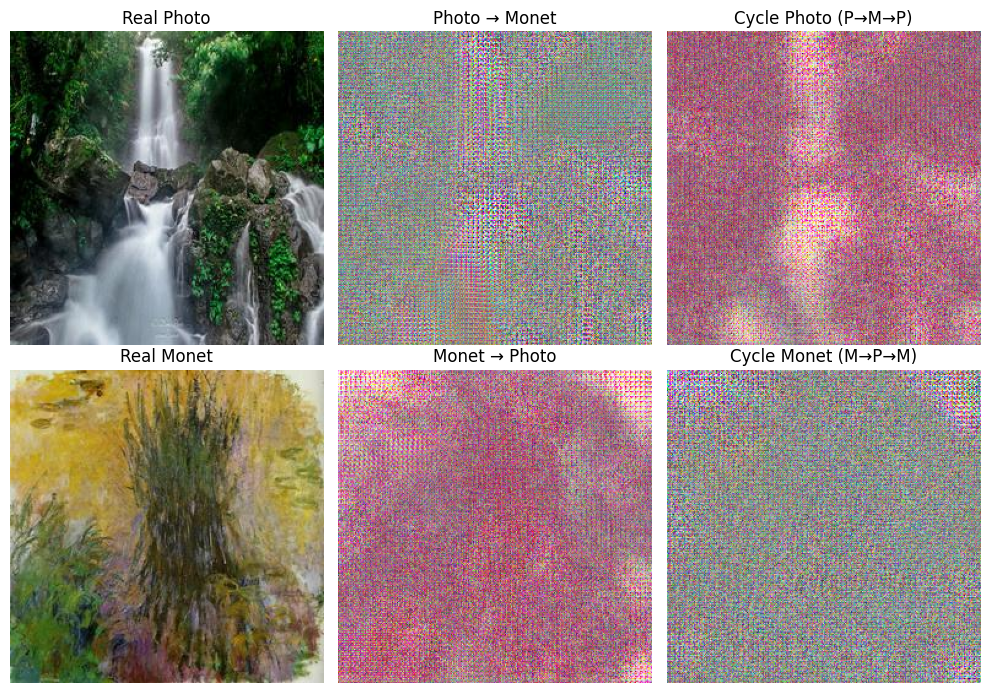

Epoch [1/25] G_total: 5.4388 D_P: 0.2330 D_M: 0.2554
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_1.pth


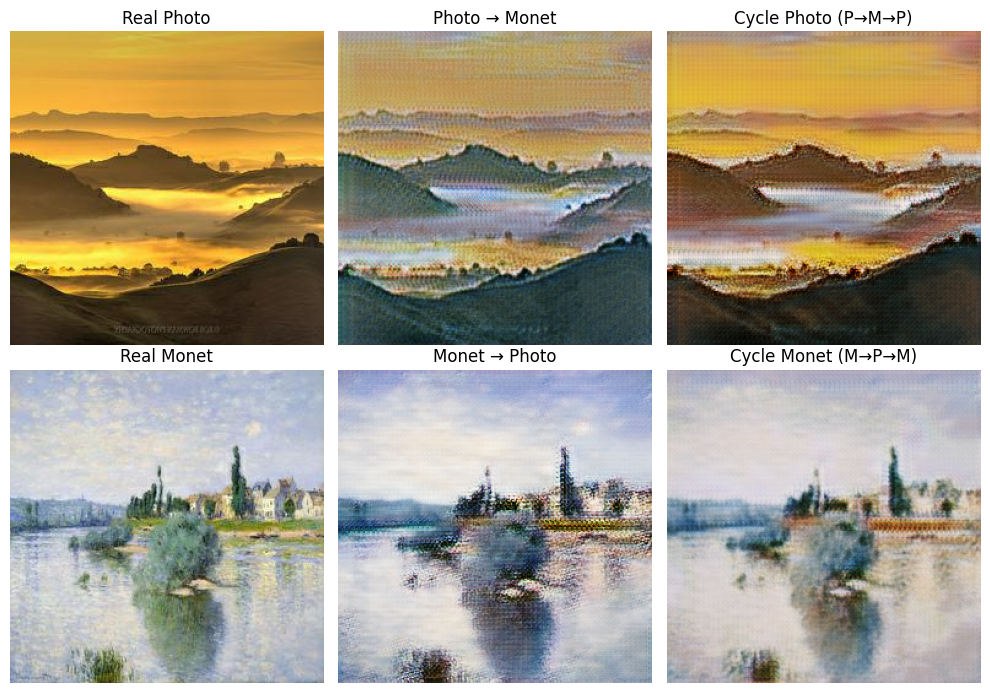

Epoch [2/25] G_total: 5.6313 D_P: 0.0223 D_M: 0.1181
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_2.pth


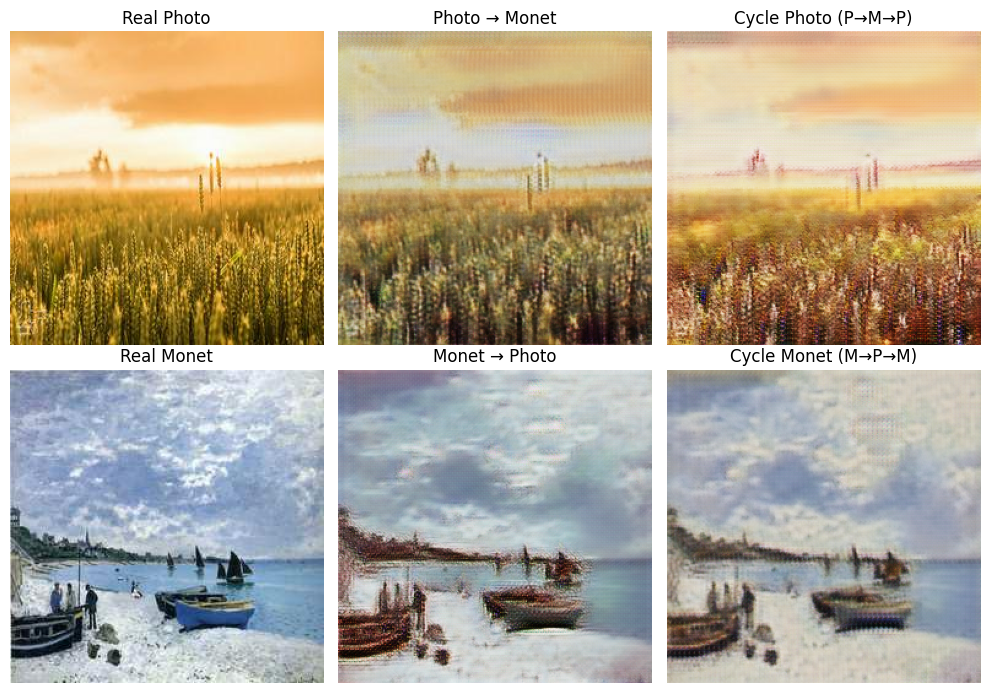

Epoch [3/25] G_total: 5.9763 D_P: 0.1253 D_M: 0.0697
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_3.pth


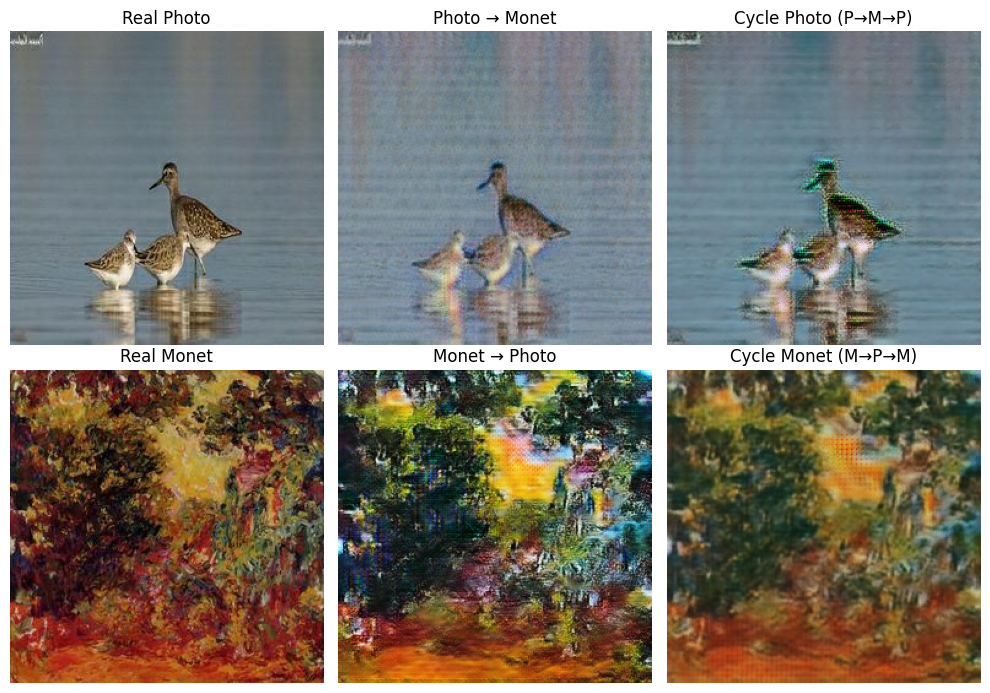

Epoch [4/25] G_total: 5.1538 D_P: 0.1284 D_M: 0.0514
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_4.pth


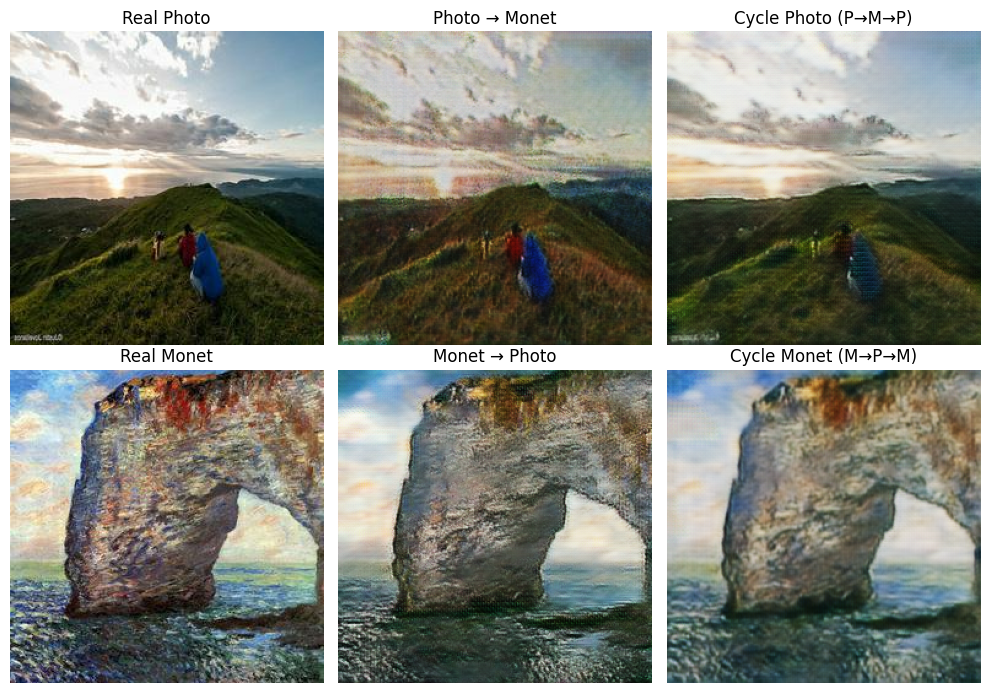

Epoch [5/25] G_total: 5.0048 D_P: 0.0518 D_M: 0.0741
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_5.pth


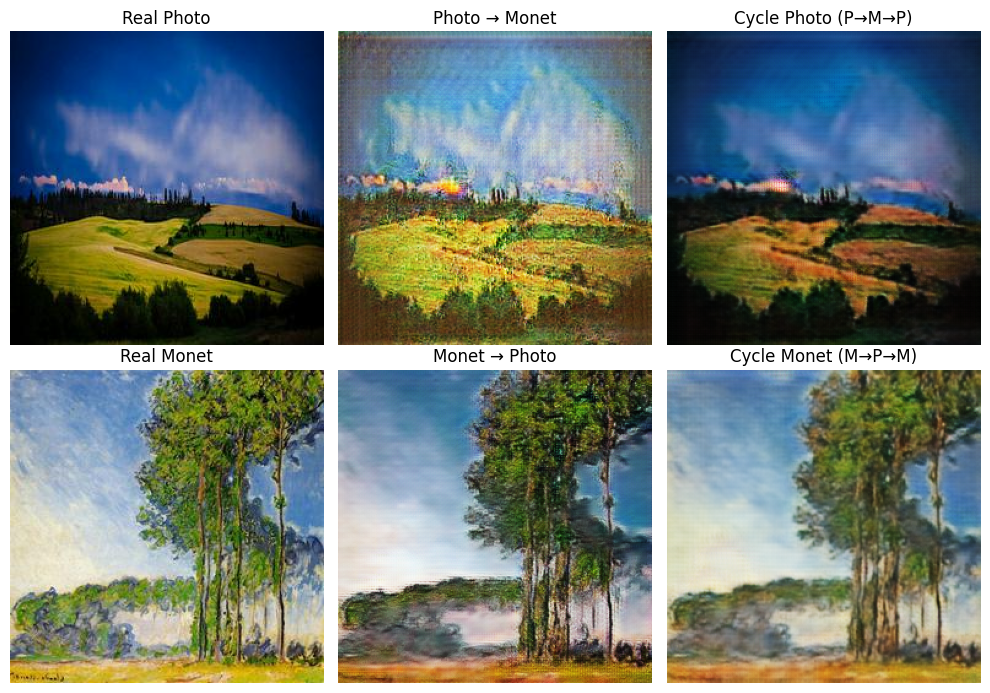

Epoch [6/25] G_total: 4.5773 D_P: 0.1853 D_M: 0.0786
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_6.pth


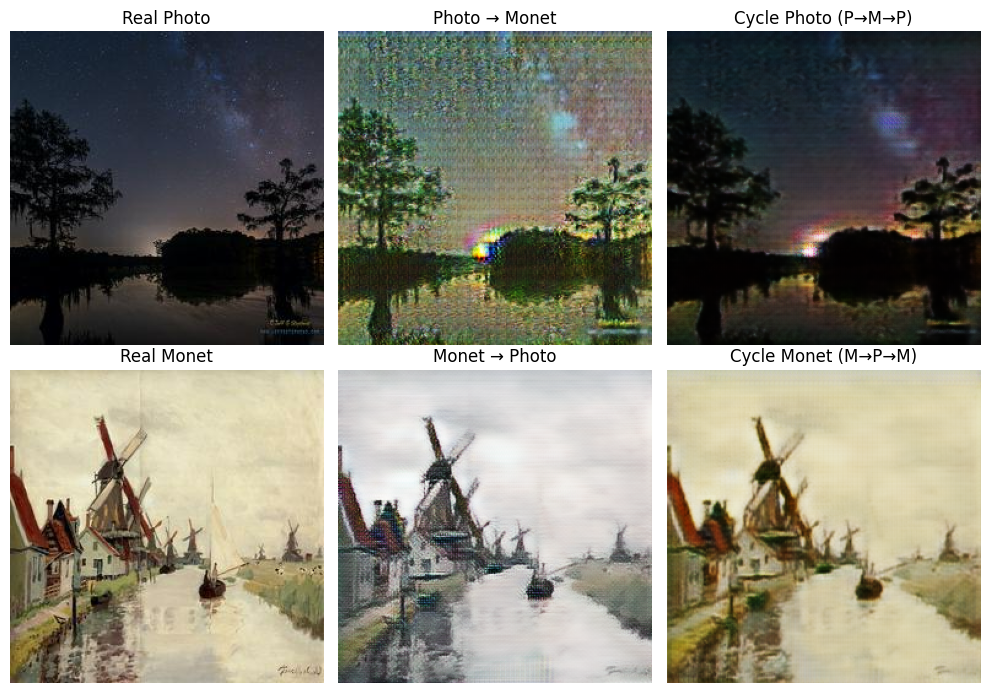

Epoch [7/25] G_total: 5.1331 D_P: 0.0922 D_M: 0.0431
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_7.pth


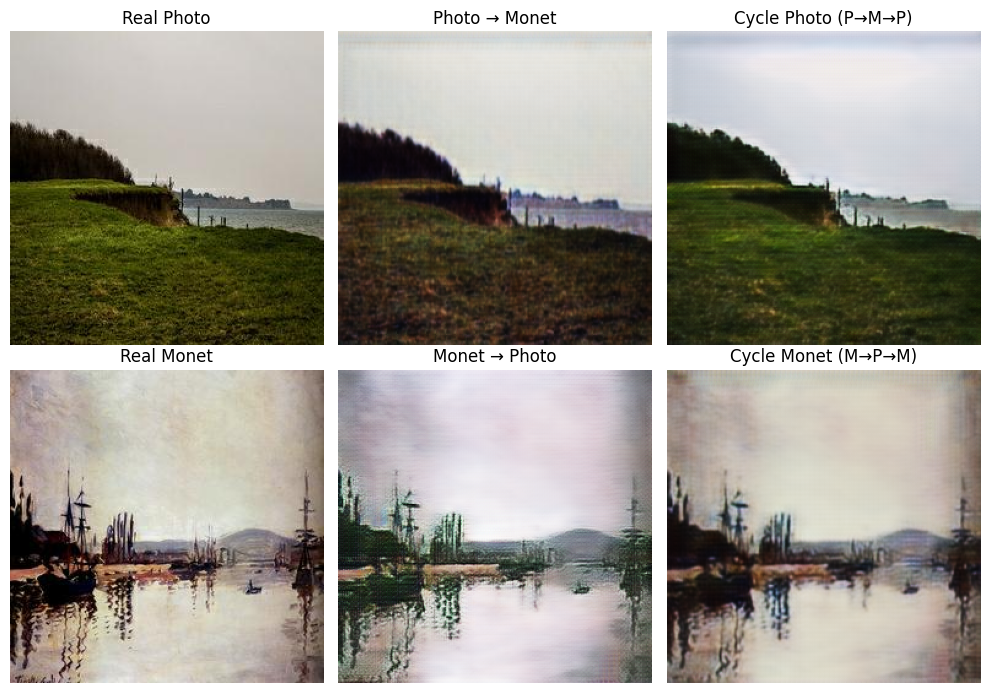

Epoch [8/25] G_total: 4.2013 D_P: 0.3240 D_M: 0.0483
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_8.pth


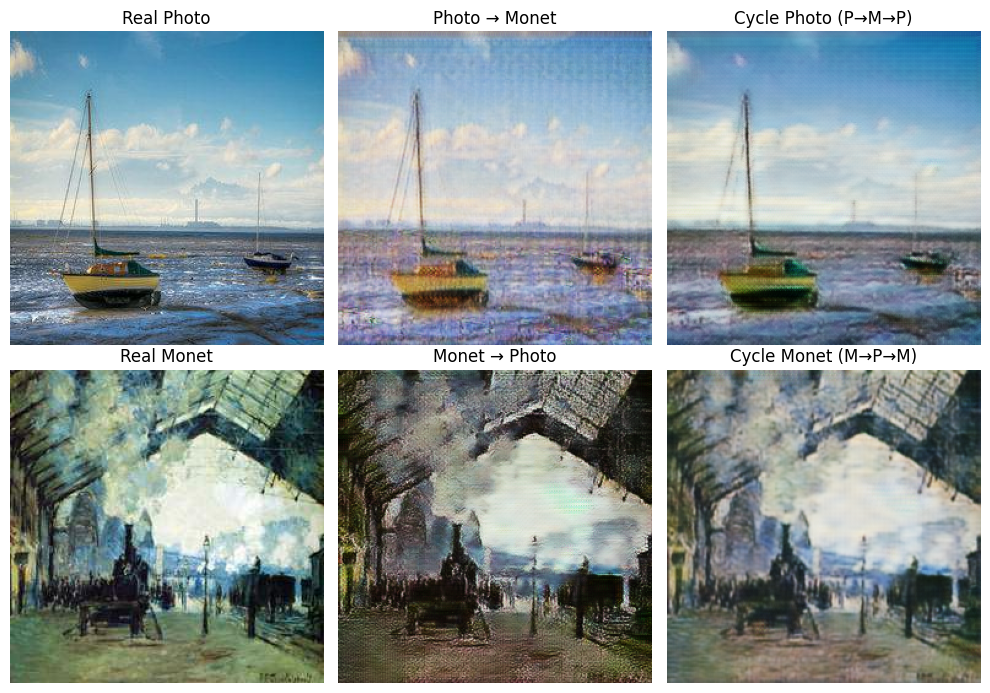

Epoch [9/25] G_total: 5.3517 D_P: 0.0482 D_M: 0.0924
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_9.pth


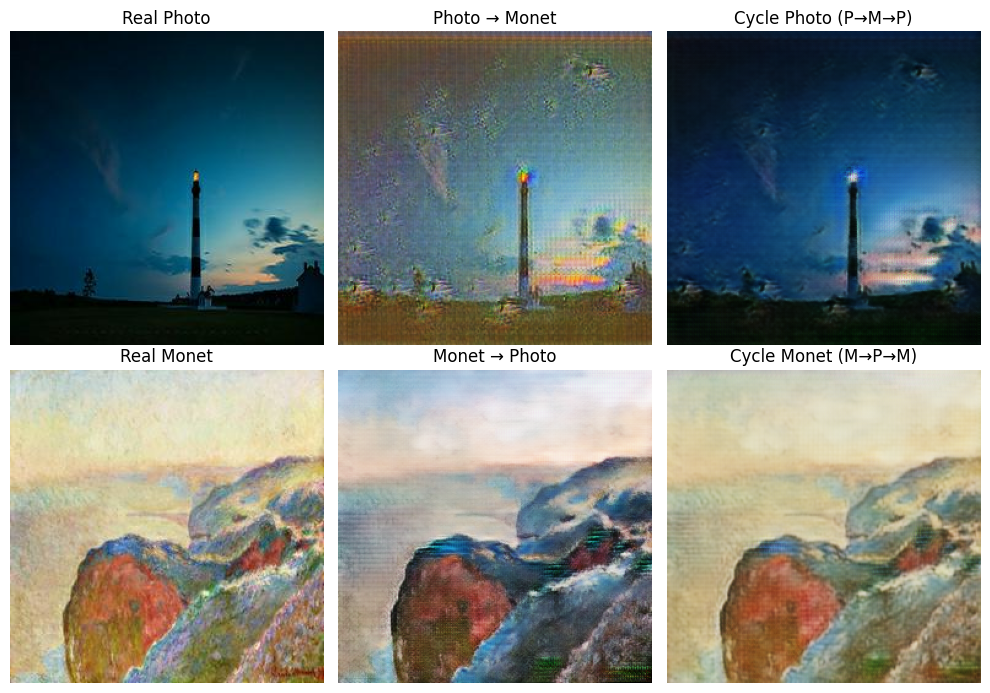

Epoch [10/25] G_total: 5.3813 D_P: 0.1087 D_M: 0.0173
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_10.pth


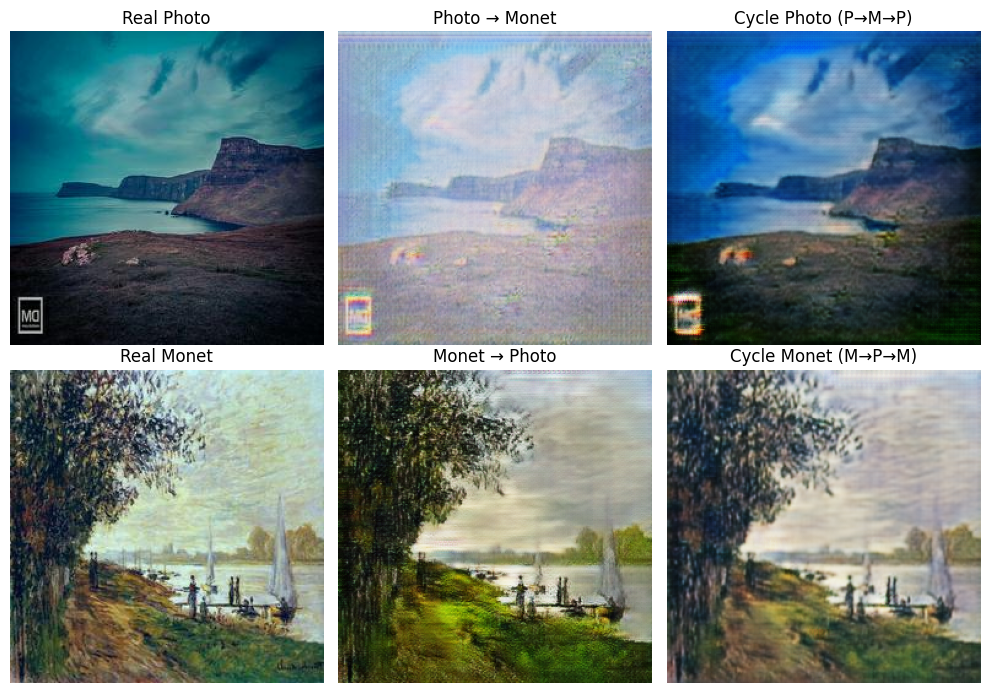

Epoch [11/25] G_total: 6.0122 D_P: 0.1394 D_M: 0.1050
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_11.pth


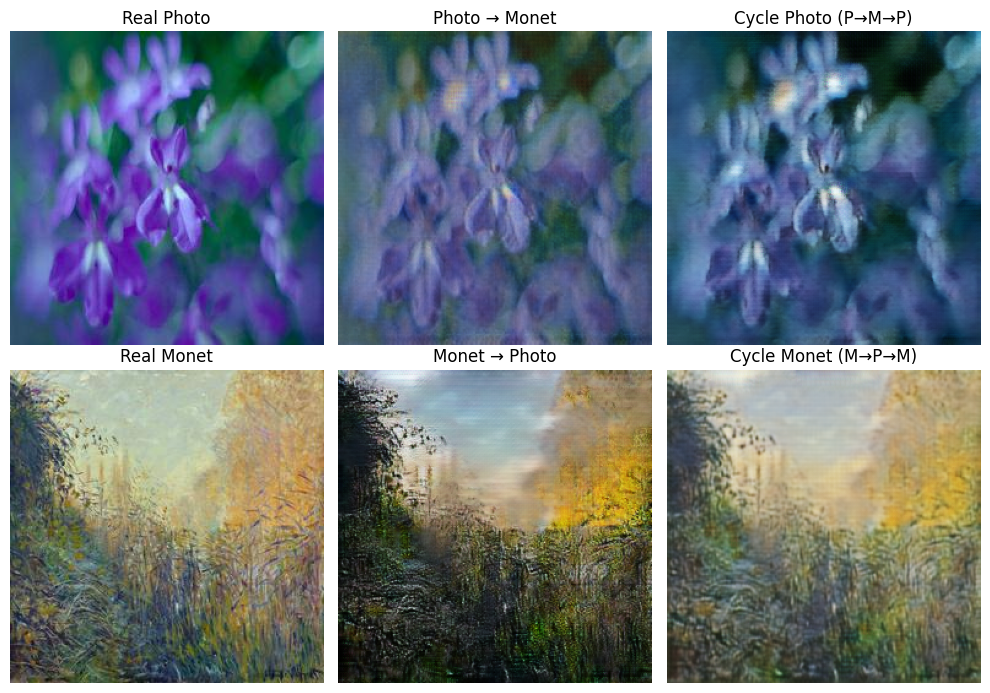

Epoch [12/25] G_total: 4.5331 D_P: 0.0327 D_M: 0.0306
Saved checkpoint: /content/drive/MyDrive/Monet/exp1_checkpoint_12.pth


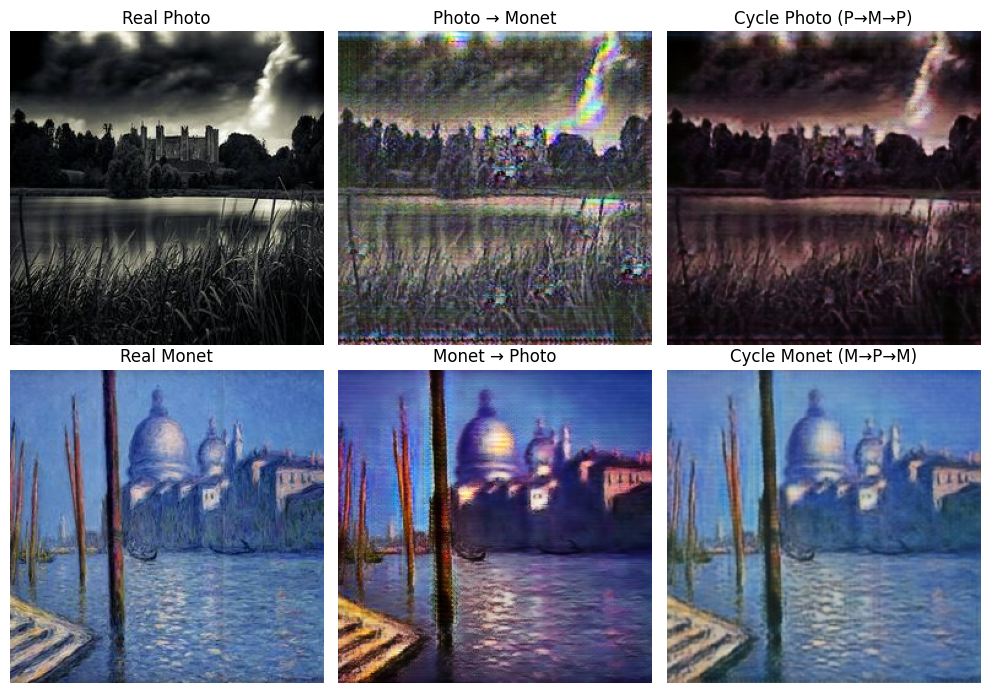

In [ ]:
epochs = config.epochs

for epoch in range(start_epoch, epochs + 1):
    for i, (real_P, real_M) in enumerate(dataloader):
        real_P = real_P.to(device)  # real photos (domain A)
        real_M = real_M.to(device)  # real Monet (domain B)

        # -------------------------------------------
        # 5.1 Train Generators (G_P2M & G_M2P)
        # -------------------------------------------
        optimizer_G.zero_grad()

        # ------- Identity loss -------
        # G_P2M(M) should be close to M (if we feed Monet to Monet-gen)
        # G_M2P(P) should be close to P
        same_M = G_P2M(real_M)
        loss_idt_M = criterion_identity(same_M, real_M) * config.lambda_idt

        same_P = G_M2P(real_P)
        loss_idt_P = criterion_identity(same_P, real_P) * config.lambda_idt

        # ------- GAN loss -------
        # Photo -> Monet
        fake_M = G_P2M(real_P)
        pred_fake_M = D_M(fake_M)
        target_real = torch.ones_like(pred_fake_M, device=device)
        loss_G_P2M = criterion_GAN(pred_fake_M, target_real)

        # Monet -> Photo
        fake_P = G_M2P(real_M)
        pred_fake_P = D_P(fake_P)
        loss_G_M2P = criterion_GAN(pred_fake_P, target_real)

        # ------- Cycle-consistency loss -------
        # P -> M -> P
        rec_P = G_M2P(fake_M)
        loss_cycle_P = criterion_cycle(rec_P, real_P)

        # M -> P -> M
        rec_M = G_P2M(fake_P)
        loss_cycle_M = criterion_cycle(rec_M, real_M)

        loss_cycle_total = (loss_cycle_P + loss_cycle_M) * config.lambda_cyc

        # Total generator loss
        loss_G_total = (
            loss_G_P2M + loss_G_M2P +
            loss_cycle_total +
            loss_idt_P + loss_idt_M
        )

        loss_G_total.backward()
        optimizer_G.step()

        # -------------------------------------------
        # 5.2 Train Discriminator D_M (Monet domain)
        # -------------------------------------------
        optimizer_D_M.zero_grad()

        # real Monet
        pred_real_M = D_M(real_M)
        target_real = torch.ones_like(pred_real_M, device=device)
        loss_D_M_real = criterion_GAN(pred_real_M, target_real)

        # fake Monet (detach so G is not updated here)
        pred_fake_M = D_M(fake_M.detach())
        target_fake = torch.zeros_like(pred_fake_M, device=device)
        loss_D_M_fake = criterion_GAN(pred_fake_M, target_fake)

        loss_D_M_total = 0.5 * (loss_D_M_real + loss_D_M_fake)
        loss_D_M_total.backward()
        optimizer_D_M.step()

        # -------------------------------------------
        # 5.3 Train Discriminator D_P (Photo domain)
        # -------------------------------------------
        optimizer_D_P.zero_grad()

        pred_real_P = D_P(real_P)
        target_real = torch.ones_like(pred_real_P, device=device)
        loss_D_P_real = criterion_GAN(pred_real_P, target_real)

        pred_fake_P = D_P(fake_P.detach())
        target_fake = torch.zeros_like(pred_fake_P, device=device)
        loss_D_P_fake = criterion_GAN(pred_fake_P, target_fake)

        loss_D_P_total = 0.5 * (loss_D_P_real + loss_D_P_fake)
        loss_D_P_total.backward()
        optimizer_D_P.step()

        # -------------------------------------------
        # 5.4 Logging
        # -------------------------------------------
        wandb.log({
            "G_total": loss_G_total.item(),
            "G_P2M_adv": loss_G_P2M.item(),
            "G_M2P_adv": loss_G_M2P.item(),
            "cycle_loss": loss_cycle_total.item(),
            "idt_P": loss_idt_P.item(),
            "idt_M": loss_idt_M.item(),
            "D_M": loss_D_M_total.item(),
            "D_P": loss_D_P_total.item()
        })

        # For first batch of each epoch, also create visualizations
        if i == 0:
            with torch.no_grad():
                # use first item in batch for clarity
                p = real_P[0:1]
                m = real_M[0:1]

                fake_m = G_P2M(p)
                cycle_p = G_M2P(fake_m)

                fake_p = G_M2P(m)
                cycle_m = G_P2M(fake_p)

                # denormalize
                p_vis = denorm(p[0]).cpu()
                m_vis = denorm(m[0]).cpu()
                fake_m_vis = denorm(fake_m[0]).cpu()
                fake_p_vis = denorm(fake_p[0]).cpu()
                cycle_p_vis = denorm(cycle_p[0]).cpu()
                cycle_m_vis = denorm(cycle_m[0]).cpu()

                # ---- Show in Colab with matplotlib ----
                fig, axes = plt.subplots(2, 3, figsize=(10, 7))

                # Row 1: Photo domain
                axes[0, 0].imshow(p_vis.permute(1, 2, 0).numpy())
                axes[0, 0].set_title("Real Photo")
                axes[0, 0].axis("off")

                axes[0, 1].imshow(fake_m_vis.permute(1, 2, 0).numpy())
                axes[0, 1].set_title("Photo → Monet")
                axes[0, 1].axis("off")

                axes[0, 2].imshow(cycle_p_vis.permute(1, 2, 0).numpy())
                axes[0, 2].set_title("Cycle Photo (P→M→P)")
                axes[0, 2].axis("off")

                # Row 2: Monet domain
                axes[1, 0].imshow(m_vis.permute(1, 2, 0).numpy())
                axes[1, 0].set_title("Real Monet")
                axes[1, 0].axis("off")

                axes[1, 1].imshow(fake_p_vis.permute(1, 2, 0).numpy())
                axes[1, 1].set_title("Monet → Photo")
                axes[1, 1].axis("off")

                axes[1, 2].imshow(cycle_m_vis.permute(1, 2, 0).numpy())
                axes[1, 2].set_title("Cycle Monet (M→P→M)")
                axes[1, 2].axis("off")

                plt.tight_layout()
                plt.show()

                # ---- Also send a grid to wandb ----
                # shape (6, 3, H, W) -> grid 2x3
                vis_tensor = torch.stack([
                    p_vis, fake_m_vis, cycle_p_vis,
                    m_vis, fake_p_vis, cycle_m_vis
                ])
                vis_grid = utils.make_grid(vis_tensor, nrow=3)
                wandb.log({"cycle_examples": wandb.Image(vis_grid)})

    print(
        f"Epoch [{epoch}/{epochs}] "
        f"G_total: {loss_G_total.item():.4f} "
        f"D_P: {loss_D_P_total.item():.4f} "
        f"D_M: {loss_D_M_total.item():.4f}"
    )

    # SAVE CHECKPOINT
    checkpoint_path = f"{checkpoint_dir}/exp1_checkpoint_{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "G_P2M": G_P2M.state_dict(),
        "G_M2P": G_M2P.state_dict(),
        "D_P": D_P.state_dict(),
        "D_M": D_M.state_dict(),
        "opt_G": optimizer_G.state_dict(),
        "opt_D_P": optimizer_D_P.state_dict(),
        "opt_D_M": optimizer_D_M.state_dict(),
    }, checkpoint_path)

    print(f"Saved checkpoint: {checkpoint_path}")



wandb.finish()